### Poojitha Venkatram

### Homework-5 Part-2

### https://github.com/poojithavenkatram/Deep-Learning

In [1]:
!pip install imageio
!pip install torchvision

In [2]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Defining a transform to normalize the data
transform = transforms.Compose([
    transforms.ToTensor(),  # Converting images to PyTorch tensors
    transforms.Normalize((0.5,), (0.5,))  # Normalizing the tensors
])

# Downloading and loading the training data
trainset = datasets.FashionMNIST('~/.pytorch/F_MNIST_data/', download=True, train=True, transform=transform)
trainloader = DataLoader(trainset, batch_size=64, shuffle=True)

# Downloading and loading the test data
testset = datasets.FashionMNIST('~/.pytorch/F_MNIST_data/', download=True, train=False, transform=transform)
testloader = DataLoader(testset, batch_size=64, shuffle=True)

# Summarizing the shape of the dataset
print('Train', len(trainset), len(trainloader))
print('Test', len(testset), len(testloader))

# Accessing a single batch
dataiter = iter(trainloader)
images, labels = next(dataiter)
print('Batch images shape:', images.shape)
print('Batch labels shape:', labels.shape)

100%|██████████| 26421880/26421880 [00:00<00:00, 115954712.08it/s]


Extracting /root/.pytorch/F_MNIST_data/FashionMNIST/raw/train-images-idx3-ubyte.gz to /root/.pytorch/F_MNIST_data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 4940530.89it/s]


Extracting /root/.pytorch/F_MNIST_data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to /root/.pytorch/F_MNIST_data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:00<00:00, 62655231.13it/s]


Extracting /root/.pytorch/F_MNIST_data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to /root/.pytorch/F_MNIST_data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 3855763.75it/s]


Extracting /root/.pytorch/F_MNIST_data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to /root/.pytorch/F_MNIST_data/FashionMNIST/raw

Train 60000 938
Test 10000 157
Batch images shape: torch.Size([64, 1, 28, 28])
Batch labels shape: torch.Size([64])


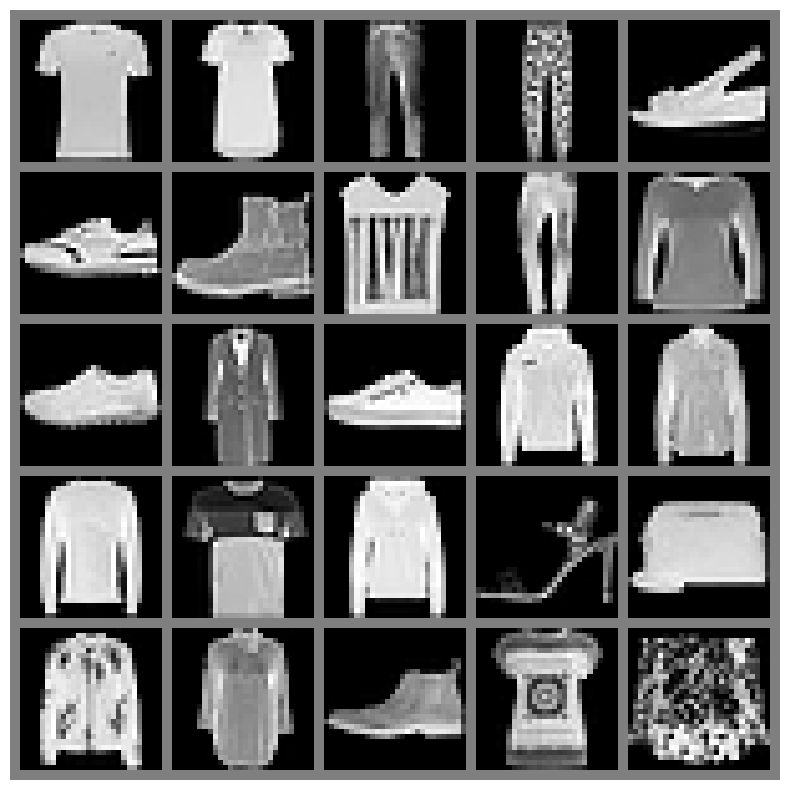

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import torchvision

# Function to show an image
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.axis('off')

# Grabbing a batch of images
dataiter = iter(trainloader)
images, labels = next(dataiter)

# Making a grid from batch
plt.figure(figsize=(10, 10))  # Set the figure size to make the images bigger
imshow(torchvision.utils.make_grid(images[:25], nrow=5))
plt.show()

In [4]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Defining a transform to normalize the data
transform = transforms.Compose([
    transforms.ToTensor(),  # Converts to [0, 1] range
    transforms.Normalize((0.5,), (0.5,))  # Normalizes to [-1, 1] range
])

# Downloading and loading the Fashion MNIST training data
trainset = datasets.FashionMNIST('~/.pytorch/F_MNIST_data/', download=True, train=True, transform=transform)

# Setting the batch size
BATCH_SIZE = 256

# DataLoader to batch and shuffle the data
trainloader = DataLoader(trainset, batch_size=BATCH_SIZE, shuffle=True)

In [5]:
import torch
from torch import nn

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.init_size = 7 * 7 * 256
        self.fc = nn.Linear(100, self.init_size, bias=False)

        self.batch_norm = nn.BatchNorm2d(256)
        self.leaky_relu = nn.LeakyReLU(0.2, inplace=True)

        self.conv_blocks = nn.Sequential(
            nn.ConvTranspose2d(256, 128, kernel_size=5, stride=1, padding=2, bias=False),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(128, 64, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2, inplace=True),

            nn.ConvTranspose2d(64, 1, kernel_size=5, stride=2, padding=2, output_padding=1, bias=False),
            nn.Tanh()
        )

    def forward(self, z):
        out = self.fc(z)
        out = out.view(-1, 256, 7, 7)  # Reshape into the format for batch normalization
        out = self.leaky_relu(self.batch_norm(out))
        img = self.conv_blocks(out)
        return img

# Initialize the generator
generator = Generator()

# Print the model
print(generator)

Generator(
  (fc): Linear(in_features=100, out_features=12544, bias=False)
  (batch_norm): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (leaky_relu): LeakyReLU(negative_slope=0.2, inplace=True)
  (conv_blocks): Sequential(
    (0): ConvTranspose2d(256, 128, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2, inplace=True)
    (3): ConvTranspose2d(128, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.2, inplace=True)
    (6): ConvTranspose2d(64, 1, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2), output_padding=(1, 1), bias=False)
    (7): Tanh()
  )
)


### Using the untrained generator to create an image

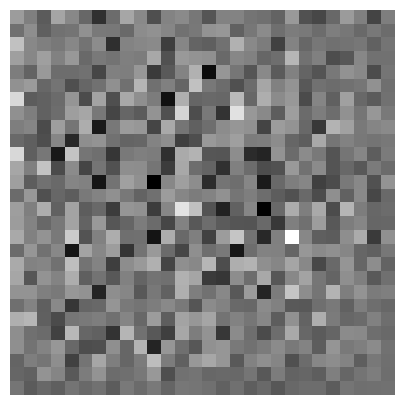

In [6]:
import matplotlib.pyplot as plt
import torch

# Function to create a batch of random noise vectors
def generate_random_noise(batch_size, dimensions):
    return torch.randn(batch_size, dimensions)

# Generate random noise
latent_dim = 100  # Dimension of the latent space
random_noise = generate_random_noise(1, latent_dim)

# Generate an image with the untrained generator
with torch.no_grad():
    generator.eval()
    fake_image = generator(random_noise.view(-1, 100)).detach().cpu()

# Visualize the generated image
plt.figure(figsize=(5, 5))
plt.imshow(fake_image.view(28, 28), cmap='gray')
plt.axis('off')  # Turn off the axis
plt.show()

#### The discriminator is a CNN-based image classifier.

In [7]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            # Input size: 1 x 28 x 28
            nn.Conv2d(1, 64, kernel_size=5, stride=2, padding=2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            # State size: 64 x 14 x 14
            nn.Conv2d(64, 128, kernel_size=5, stride=2, padding=2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            # State size: 128 x 7 x 7
            nn.Flatten(),
            nn.Linear(128 * 7 * 7, 1),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.model(input)

# Initialize the discriminator
discriminator = Discriminator()

# Print the model
print(discriminator)

Discriminator(
  (model): Sequential(
    (0): Conv2d(1, 64, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Dropout(p=0.3, inplace=False)
    (3): Conv2d(64, 128, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Dropout(p=0.3, inplace=False)
    (6): Flatten(start_dim=1, end_dim=-1)
    (7): Linear(in_features=6272, out_features=1, bias=True)
    (8): Sigmoid()
  )
)


#### For the untrained discriminator to classify the generated images as real or fake.

In [8]:
import torch

latent_vector_size = 100
# Generating random noise as input for the generator
random_noise = torch.randn(1, latent_vector_size)

# Generating a fake image from the noise
generator.eval()
with torch.no_grad():
    generated_image = generator(random_noise)

# Passing the generated image through the discriminator
discriminator.eval()
with torch.no_grad():
    decision = discriminator(generated_image)

print(decision)

decision_scalar = decision.item()
threshold = 0.5

if decision_scalar < threshold:
    print(f"Discriminator's decision ({decision_scalar:.4f}): The image is FAKE.")
else:
    print(f"Discriminator's decision ({decision_scalar:.4f}): The image is REAL.")

tensor([[0.5104]])
Discriminator's decision (0.5104): The image is REAL.


#### Defining the loss and optimizers

In [9]:
import torch
import torch.nn as nn
import torch.optim as optim

mse_loss = nn.MSELoss()

def discriM_loss(real_output, fake_output):
    # Real images should be classified as 1
    real_loss = mse_loss(torch.ones_like(real_output), real_output)
    # Fake images should be classified as 0
    fake_loss = mse_loss(torch.zeros_like(fake_output), fake_output)
    # Total loss
    total_loss = real_loss + fake_loss
    return total_loss

def genG_loss(fake_output):
    # Generator wants the discriminator to mistake images as real
    return mse_loss(torch.ones_like(fake_output), fake_output)

lr = 1e-4  # Learning rate

# Optimizers
genG_optimizer = optim.Adam(generator.parameters(), lr=lr)
discriM_optimizer = optim.Adam(discriminator.parameters(), lr=lr)

##### Saving the Checkpoints in Pytorch

In [10]:
import os

checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

# Ensure checkpoint directory exists
os.makedirs(checkpoint_dir, exist_ok=True)

# Function to save checkpoints
def save_checkpoint(epoch):
    torch.save({
        'epoch': epoch,
        'genG_state_dict': generator.state_dict(),
        'discriM_state_dict': discriminator.state_dict(),
        'genG_optimizer_state_dict': genG_optimizer.state_dict(),
        'discriM_optimizer_state_dict': discriM_optimizer.state_dict(),
    }, f"{checkpoint_prefix}_{epoch}.pth")

###### Defining the Training Loop

In [11]:
import torch

# Defining the number of epochs to train for
EPOCHS = 50
noise_dim = 100
num_examples_to_generate = 16

# To reuse this seed over time so it's easier to visualize progress
seed = torch.randn(num_examples_to_generate, noise_dim)

In [12]:
def train_step(real_images):
    # Get batch size from the real images
    batch_size = real_images.size(0)

    # Generate random noise to feed into the generator
    noise = torch.randn(batch_size, noise_dim, device=device)

    # Generate fake images
    fake_images = generator(noise)

    ### Train Discriminator: maximize log(D(x)) + log(1 - D(G(z)))
    discriM_optimizer.zero_grad()

    # Loss for real images
    real_output = discriminator(real_images)
    real_loss = mse_loss(real_output, torch.ones_like(real_output, device=device))

    # Loss for fake images
    fake_output = discriminator(fake_images.detach())
    fake_loss = mse_loss(fake_output, torch.zeros_like(fake_output, device=device))

    # Combine losses
    d_loss = real_loss + fake_loss
    # Update discriminator
    d_loss.backward()
    discriM_optimizer.step()

    # Train Generator: maximize log(D(G(z)))
    genG_optimizer.zero_grad()

    # Loss for fake images, but with flipped labels
    output = discriminator(fake_images)
    g_loss = mse_loss(output, torch.ones_like(output, device=device))

    # Update generator
    g_loss.backward()
    genG_optimizer.step()

    return g_loss.item(), d_loss.item()

In [47]:
def trn_img(images, genG, discriminator, optimizerG, optimizerD, criterion, device):
    batch_size = images.size(0)
    noise_dim = 100  # Assuming noise dimension is 100, adjust as necessary

    # Generate fake images
    noise = torch.randn(batch_size, noise_dim, device=device)
    fake_images = genG(noise)

    # Train Discriminator
    optimizerD.zero_grad()

    # Train on Real Images
    real_labels = torch.ones(batch_size, device=device)
    real_output = discriminator(images).view(-1)
    lossD_real = criterion(real_output, real_labels)

    # Train on Fake Images
    fake_labels = torch.zeros(batch_size, device=device)
    fake_output = discriminator(fake_images.detach()).view(-1)
    lossD_fake = criterion(fake_output, fake_labels)

    # Combine losses for the discriminator
    lossD = (lossD_real + lossD_fake) / 2
    lossD.backward()
    optimizerD.step()

    # Train Generator
    optimizerG.zero_grad()
    # Fake images are already generated, so we reuse them here
    gen_labels = torch.ones(batch_size, device=device)
    output = discriminator(fake_images).view(-1)
    lossG = criterion(output, gen_labels)
    lossG.backward()
    optimizerG.step()

    return lossD, lossG

In [43]:
import time
import torch

def train(dataset, epochs, genG, seed, checkpoint_prefix, discriminator, optimizerG, optimizerD, criterion, device):
    for epoch in range(epochs):
        start = time.time()

        total_loss_d, total_loss_g = 0.0, 0.0
        num_batches = 0

        for image_batch, _ in dataset:
            image_batch = image_batch.to(device)
            loss_d, loss_g = trn_img(image_batch, genG, discriminator, optimizerG, optimizerD, criterion, device)

            total_loss_d += loss_d.item()
            total_loss_g += loss_g.item()
            num_batches += 1

        avg_loss_d = total_loss_d / num_batches
        avg_loss_g = total_loss_g / num_batches

        # Produce images for the GIF as we go
        sv_img(genG, epoch + 1, seed)

        # Save the model every 15 epochs
        if (epoch + 1) % 15 == 0:
            save_checkpoint(epoch + 1, genG, discriminator, optimizerG, optimizerD, checkpoint_prefix)
            print(f'Checkpoint saved at Epoch [{epoch+1}/{epochs}].')

        # Print the average loss
        print(f'Epoch [{epoch+1}/{epochs}] completed. Avg Loss D: {avg_loss_d:.4f}, Avg Loss G: {avg_loss_g:.4f}')
        print('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

    # Generate after the final epoch
    sv_img(genG, epochs, seed)

In [31]:
from IPython.display import display, clear_output
import matplotlib.pyplot as plt
import torch
import torchvision.utils as vutils

def sv_img(generator, epoch, seed):
    with torch.no_grad():
        # Generate images from the seed
        fake_images = generator(seed).detach().cpu()
        img_grid = vutils.make_grid(fake_images, padding=2, normalize=True)

    # Display images
    plt.figure(figsize=(5,5))
    plt.imshow(img_grid.permute(1, 2, 0))
    plt.axis('off')
    plt.show()

    # Save images to files
    plt.savefig(f'generated_images_epoch_{epoch}.png')
    plt.close()

In [25]:
import os

def save_checkpoint(epoch, generator, discriminator, optimizerG, optimizerD, save_dir):
    checkpoint = {
        'epoch': epoch,
        'generator_state_dict': generator.state_dict(),
        'discriminator_state_dict': discriminator.state_dict(),
        'optimizerG_state_dict': optimizerG.state_dict(),
        'optimizerD_state_dict': optimizerD.state_dict(),
    }
    os.makedirs(save_dir, exist_ok=True)  # Create save directory if it doesn't exist
    torch.save(checkpoint, os.path.join(save_dir, f"checkpoint_epoch_{epoch}.pth"))
    print(f"Checkpoint saved at epoch {epoch}")

save_dir = './model_weights'

##### Train the model

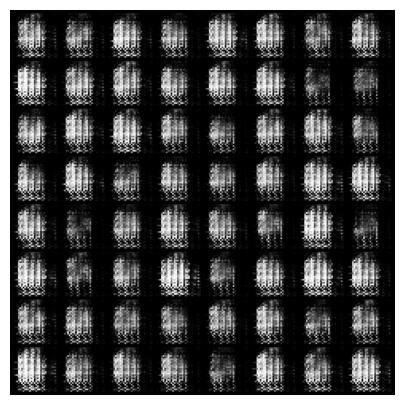

Epoch [1/50] completed. Avg Loss D: 0.2236, Avg Loss G: 0.4697
Time for epoch 1 is 16.325650930404663 sec


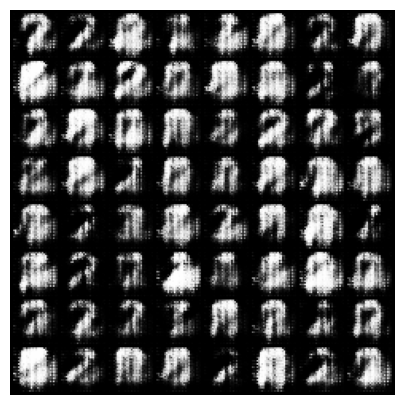

Epoch [2/50] completed. Avg Loss D: 0.2324, Avg Loss G: 0.3762
Time for epoch 2 is 16.263486623764038 sec


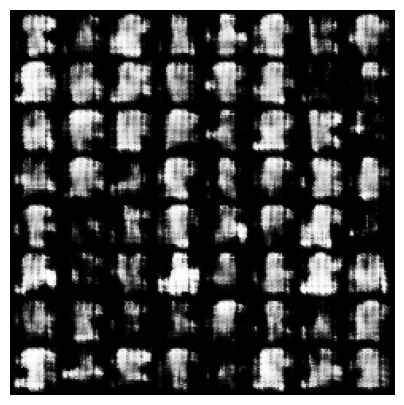

Epoch [3/50] completed. Avg Loss D: 0.2196, Avg Loss G: 0.3587
Time for epoch 3 is 16.441694974899292 sec


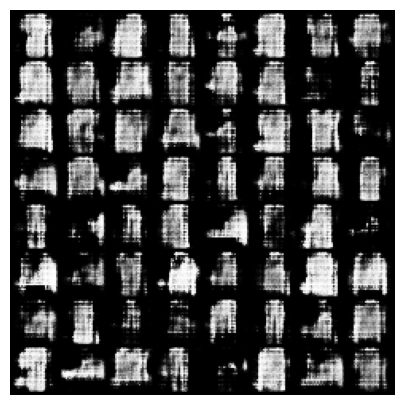

Epoch [4/50] completed. Avg Loss D: 0.2140, Avg Loss G: 0.3609
Time for epoch 4 is 16.363453149795532 sec


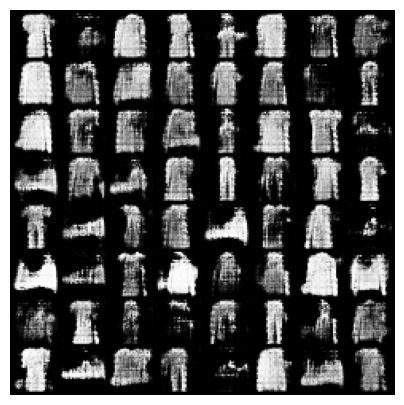

Epoch [5/50] completed. Avg Loss D: 0.2055, Avg Loss G: 0.3670
Time for epoch 5 is 16.41061496734619 sec


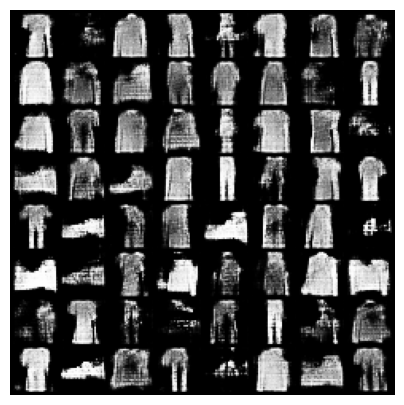

Epoch [6/50] completed. Avg Loss D: 0.2206, Avg Loss G: 0.3420
Time for epoch 6 is 16.398082971572876 sec


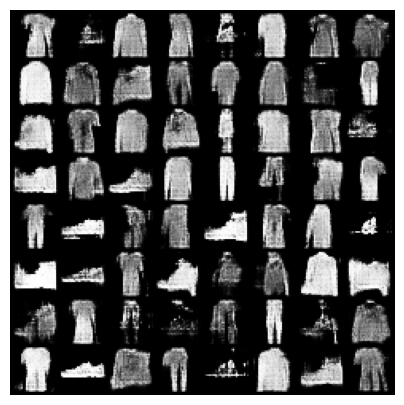

Epoch [7/50] completed. Avg Loss D: 0.2263, Avg Loss G: 0.3276
Time for epoch 7 is 16.317729711532593 sec


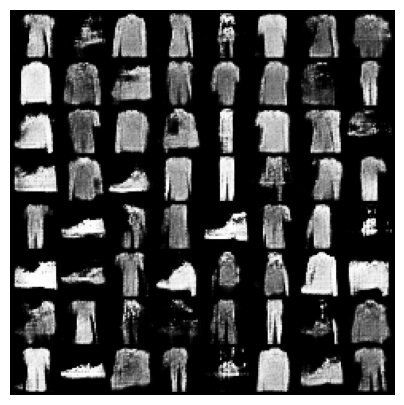

Epoch [8/50] completed. Avg Loss D: 0.2257, Avg Loss G: 0.3205
Time for epoch 8 is 16.221898794174194 sec


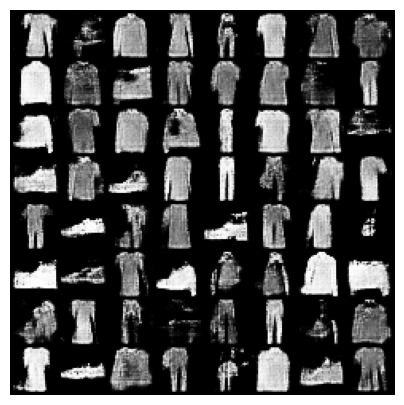

Epoch [9/50] completed. Avg Loss D: 0.2275, Avg Loss G: 0.3204
Time for epoch 9 is 16.148019313812256 sec


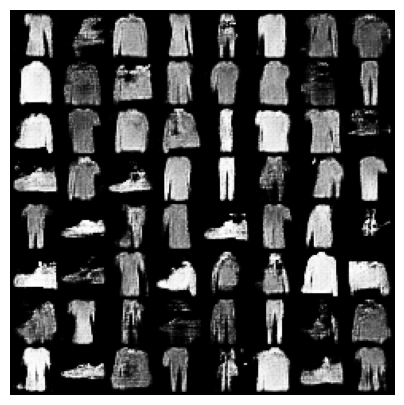

Epoch [10/50] completed. Avg Loss D: 0.2284, Avg Loss G: 0.3144
Time for epoch 10 is 16.512733936309814 sec


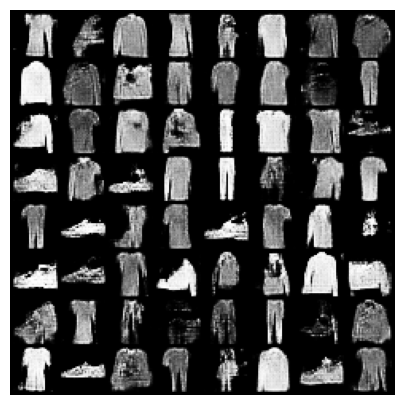

Epoch [11/50] completed. Avg Loss D: 0.2301, Avg Loss G: 0.3132
Time for epoch 11 is 16.455439805984497 sec


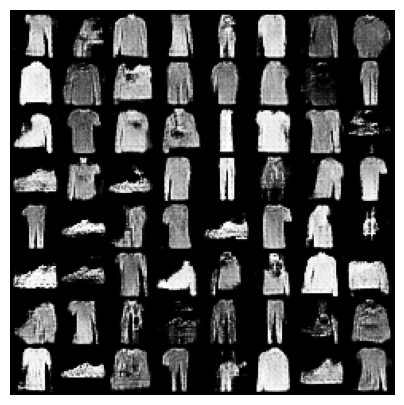

Epoch [12/50] completed. Avg Loss D: 0.2305, Avg Loss G: 0.3111
Time for epoch 12 is 16.478655099868774 sec


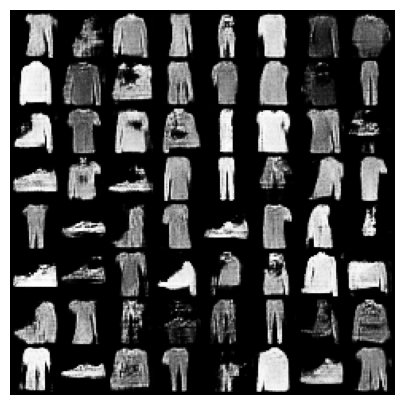

Epoch [13/50] completed. Avg Loss D: 0.2313, Avg Loss G: 0.3125
Time for epoch 13 is 16.330224990844727 sec


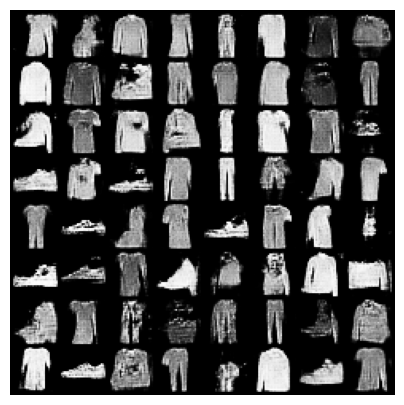

Epoch [14/50] completed. Avg Loss D: 0.2318, Avg Loss G: 0.3099
Time for epoch 14 is 16.362797021865845 sec


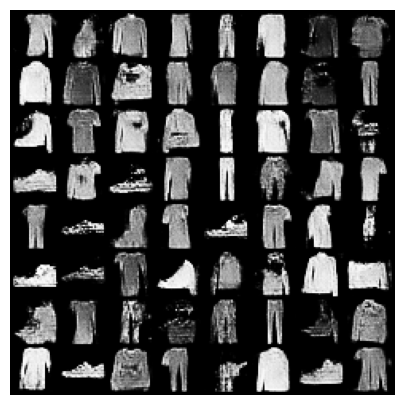

Checkpoint saved at epoch 15
Checkpoint saved at Epoch [15/50].
Epoch [15/50] completed. Avg Loss D: 0.2316, Avg Loss G: 0.3086
Time for epoch 15 is 16.427541732788086 sec


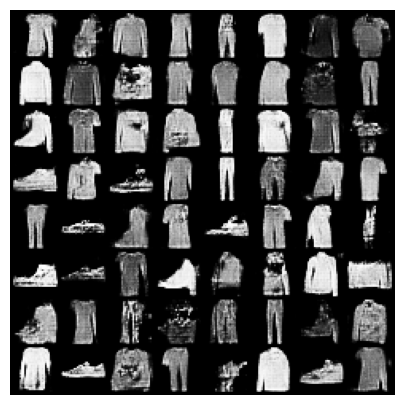

Epoch [16/50] completed. Avg Loss D: 0.2321, Avg Loss G: 0.3100
Time for epoch 16 is 16.280702590942383 sec


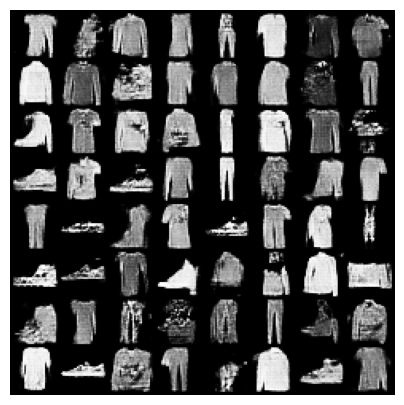

Epoch [17/50] completed. Avg Loss D: 0.2325, Avg Loss G: 0.3129
Time for epoch 17 is 16.325348377227783 sec


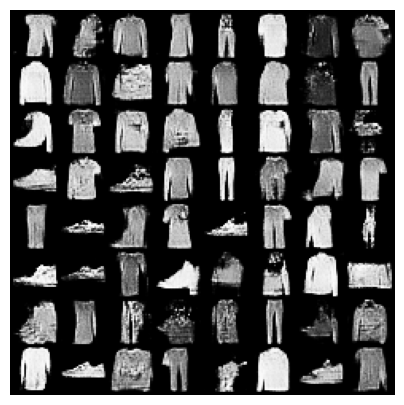

Epoch [18/50] completed. Avg Loss D: 0.2324, Avg Loss G: 0.3090
Time for epoch 18 is 16.025168418884277 sec


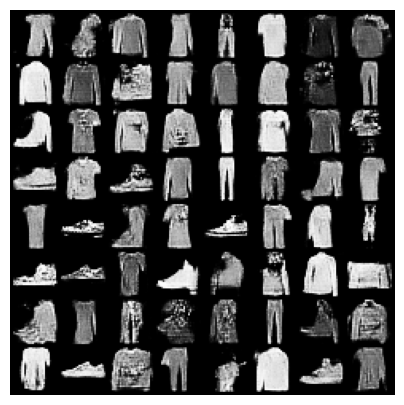

Epoch [19/50] completed. Avg Loss D: 0.2321, Avg Loss G: 0.3115
Time for epoch 19 is 16.28268790245056 sec


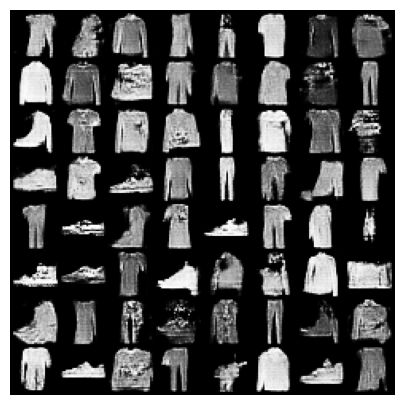

Epoch [20/50] completed. Avg Loss D: 0.2321, Avg Loss G: 0.3137
Time for epoch 20 is 16.196884632110596 sec


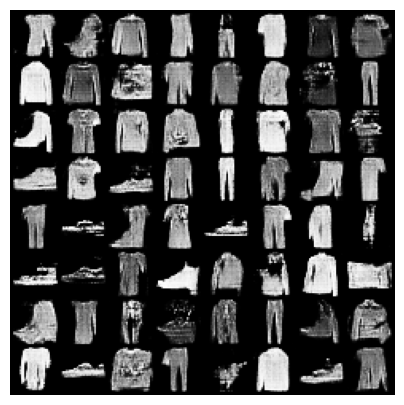

Epoch [21/50] completed. Avg Loss D: 0.2318, Avg Loss G: 0.3117
Time for epoch 21 is 16.179748058319092 sec


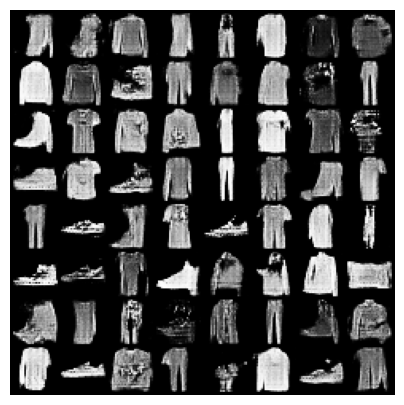

Epoch [22/50] completed. Avg Loss D: 0.2315, Avg Loss G: 0.3135
Time for epoch 22 is 16.305354595184326 sec


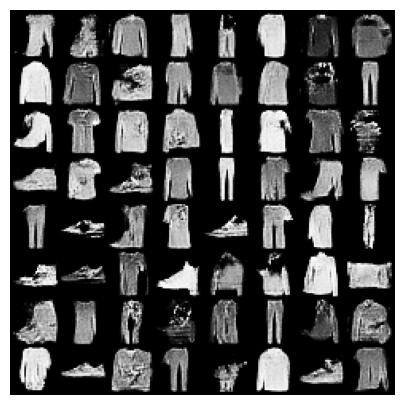

Epoch [23/50] completed. Avg Loss D: 0.2315, Avg Loss G: 0.3138
Time for epoch 23 is 16.32703995704651 sec


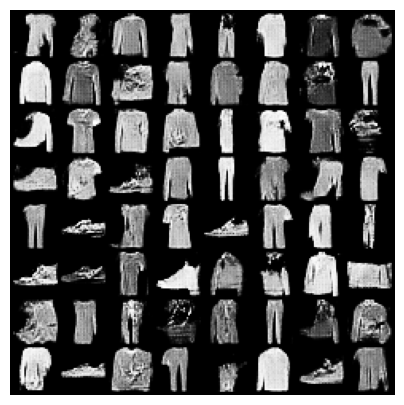

Epoch [24/50] completed. Avg Loss D: 0.2316, Avg Loss G: 0.3138
Time for epoch 24 is 16.043510913848877 sec


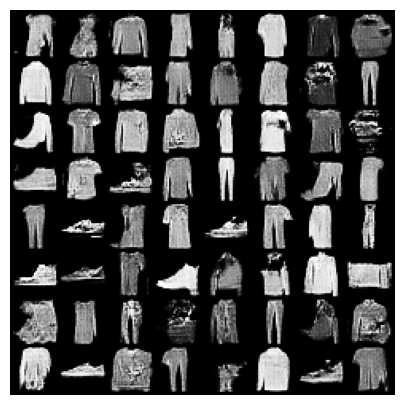

Epoch [25/50] completed. Avg Loss D: 0.2322, Avg Loss G: 0.3155
Time for epoch 25 is 16.152422428131104 sec


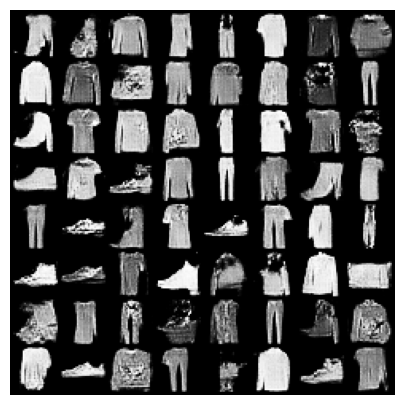

Epoch [26/50] completed. Avg Loss D: 0.2319, Avg Loss G: 0.3133
Time for epoch 26 is 16.02741527557373 sec


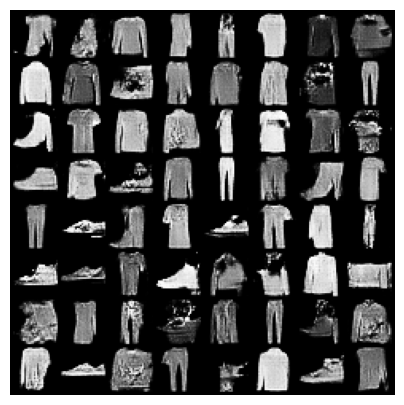

Epoch [27/50] completed. Avg Loss D: 0.2321, Avg Loss G: 0.3140
Time for epoch 27 is 16.00111413002014 sec


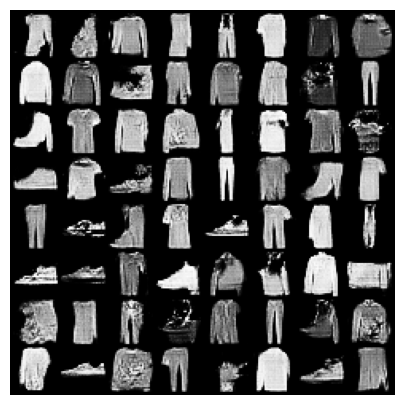

Epoch [28/50] completed. Avg Loss D: 0.2321, Avg Loss G: 0.3134
Time for epoch 28 is 16.092509031295776 sec


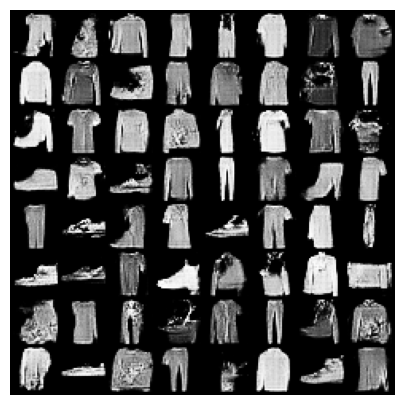

Epoch [29/50] completed. Avg Loss D: 0.2323, Avg Loss G: 0.3133
Time for epoch 29 is 16.305171728134155 sec


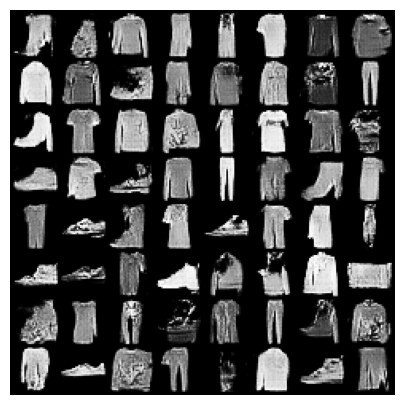

Checkpoint saved at epoch 30
Checkpoint saved at Epoch [30/50].
Epoch [30/50] completed. Avg Loss D: 0.2327, Avg Loss G: 0.3140
Time for epoch 30 is 16.05366015434265 sec


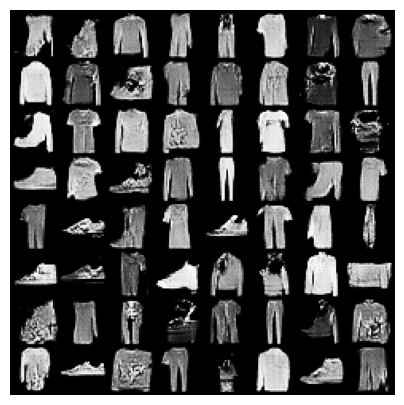

Epoch [31/50] completed. Avg Loss D: 0.2327, Avg Loss G: 0.3143
Time for epoch 31 is 16.106794595718384 sec


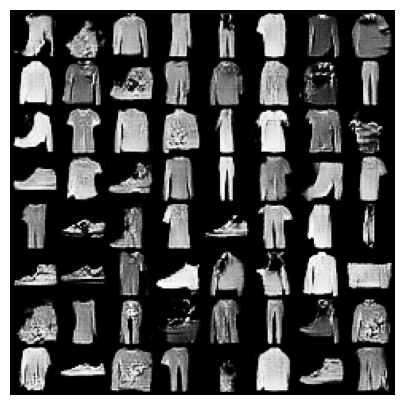

Epoch [32/50] completed. Avg Loss D: 0.2328, Avg Loss G: 0.3130
Time for epoch 32 is 15.86011552810669 sec


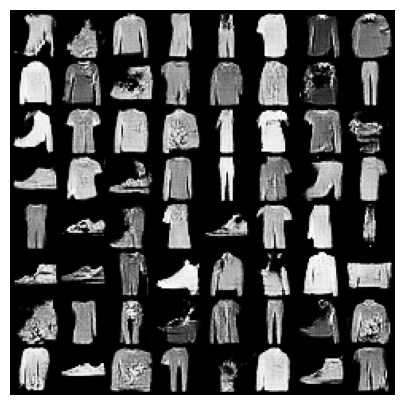

Epoch [33/50] completed. Avg Loss D: 0.2322, Avg Loss G: 0.3114
Time for epoch 33 is 16.19046425819397 sec


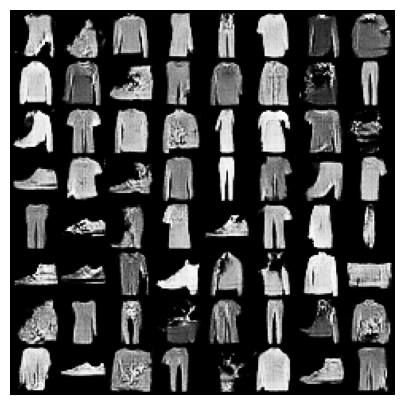

Epoch [34/50] completed. Avg Loss D: 0.2330, Avg Loss G: 0.3119
Time for epoch 34 is 16.339536905288696 sec


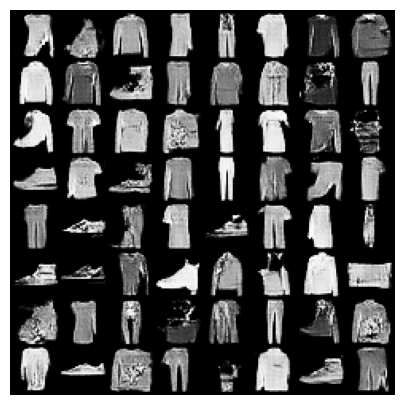

Epoch [35/50] completed. Avg Loss D: 0.2321, Avg Loss G: 0.3104
Time for epoch 35 is 16.167888402938843 sec


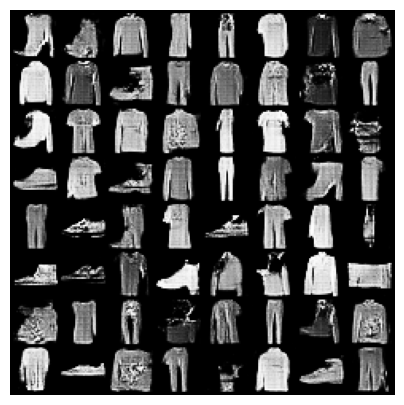

Epoch [36/50] completed. Avg Loss D: 0.2325, Avg Loss G: 0.3138
Time for epoch 36 is 16.20603370666504 sec


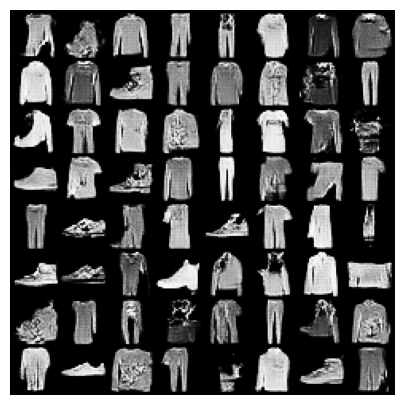

Epoch [37/50] completed. Avg Loss D: 0.2329, Avg Loss G: 0.3129
Time for epoch 37 is 16.546297788619995 sec


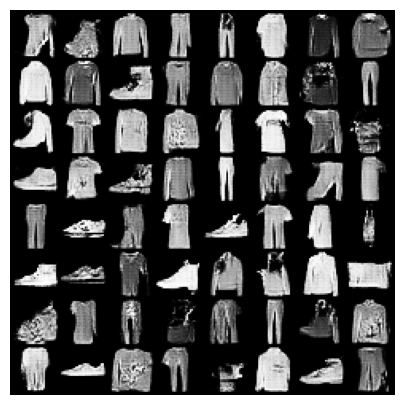

Epoch [38/50] completed. Avg Loss D: 0.2328, Avg Loss G: 0.3124
Time for epoch 38 is 16.558262586593628 sec


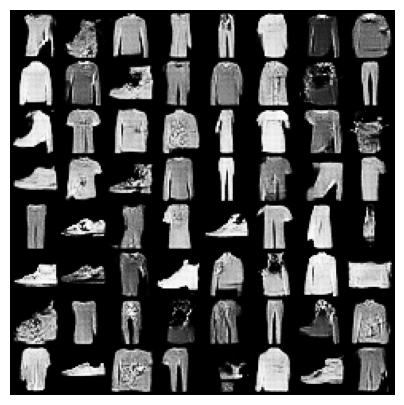

Epoch [39/50] completed. Avg Loss D: 0.2325, Avg Loss G: 0.3147
Time for epoch 39 is 16.2687771320343 sec


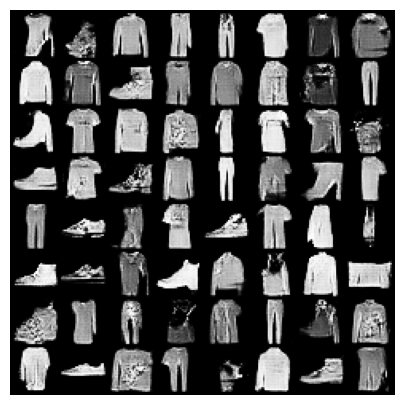

Epoch [40/50] completed. Avg Loss D: 0.2334, Avg Loss G: 0.3122
Time for epoch 40 is 16.178019046783447 sec


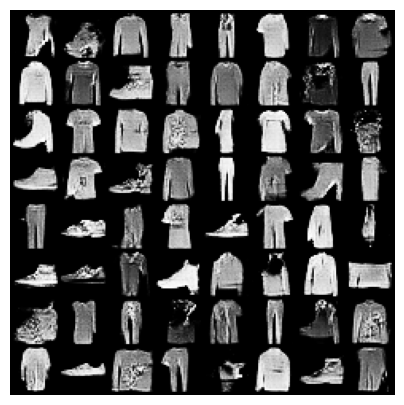

Epoch [41/50] completed. Avg Loss D: 0.2333, Avg Loss G: 0.3110
Time for epoch 41 is 16.187373876571655 sec


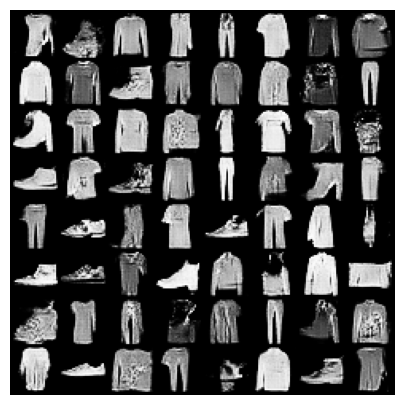

Epoch [42/50] completed. Avg Loss D: 0.2333, Avg Loss G: 0.3095
Time for epoch 42 is 16.18431544303894 sec


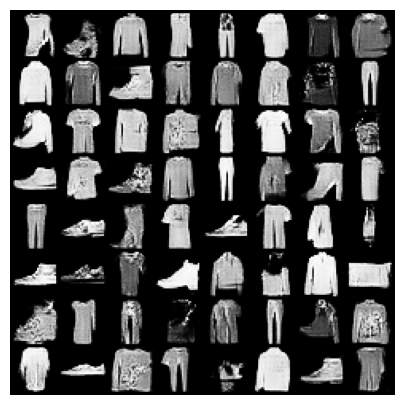

Epoch [43/50] completed. Avg Loss D: 0.2329, Avg Loss G: 0.3113
Time for epoch 43 is 16.076940298080444 sec


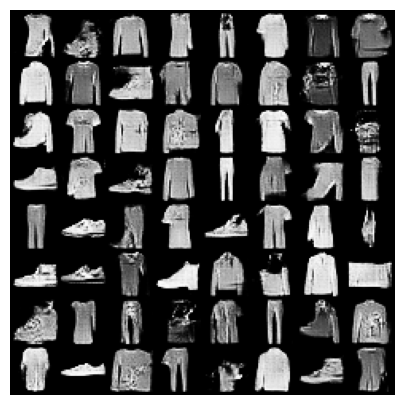

Epoch [44/50] completed. Avg Loss D: 0.2336, Avg Loss G: 0.3118
Time for epoch 44 is 16.213716745376587 sec


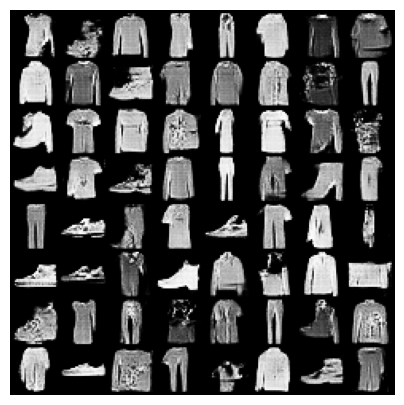

Checkpoint saved at epoch 45
Checkpoint saved at Epoch [45/50].
Epoch [45/50] completed. Avg Loss D: 0.2336, Avg Loss G: 0.3103
Time for epoch 45 is 16.278486728668213 sec


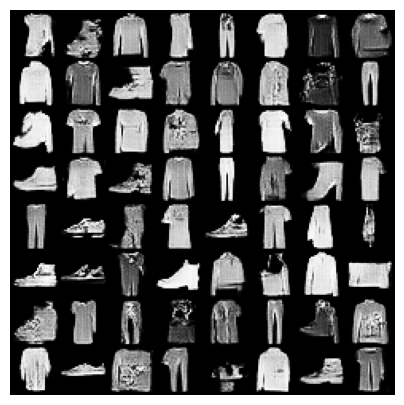

Epoch [46/50] completed. Avg Loss D: 0.2340, Avg Loss G: 0.3106
Time for epoch 46 is 15.943831443786621 sec


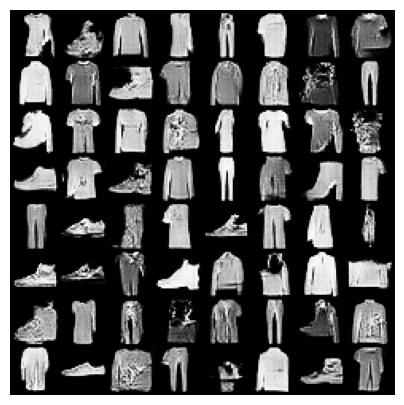

Epoch [47/50] completed. Avg Loss D: 0.2342, Avg Loss G: 0.3086
Time for epoch 47 is 16.198142290115356 sec


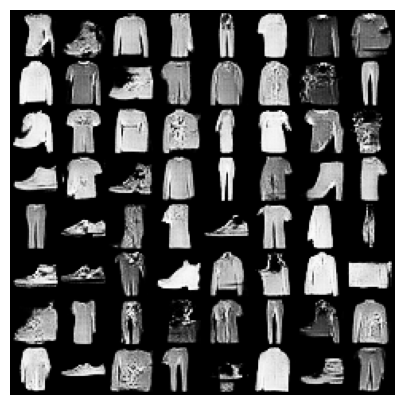

Epoch [48/50] completed. Avg Loss D: 0.2335, Avg Loss G: 0.3068
Time for epoch 48 is 16.274336576461792 sec


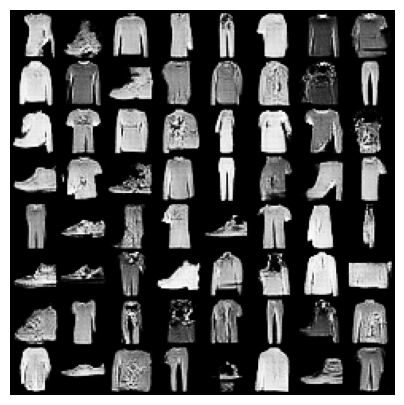

Epoch [49/50] completed. Avg Loss D: 0.2341, Avg Loss G: 0.3083
Time for epoch 49 is 16.332308053970337 sec


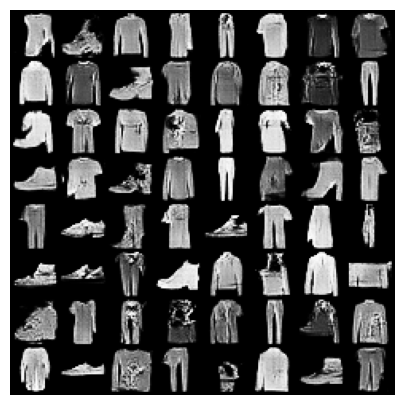

Epoch [50/50] completed. Avg Loss D: 0.2342, Avg Loss G: 0.3089
Time for epoch 50 is 16.158653020858765 sec


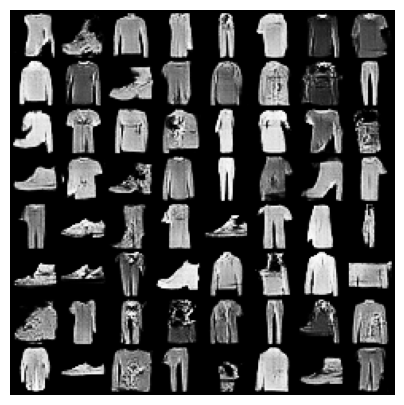

In [48]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.utils as vutils

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Instantiate the models
genG = Generator().to(device)
discriminator = Discriminator().to(device)

# Optimizers
optimizerG = optim.Adam(genG.parameters(), lr=0.0002, betas=(0.5, 0.999))
optimizerD = optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

# Loss function
criterion = nn.MSELoss()

# Seed for generating images
seed_size = 100
fixed_seed = torch.randn(64, seed_size, device=device)

# DataLoader
trn_data = trainloader

# Training epochs
EPOCHS = 50

# Train function
train(trn_data, EPOCHS, genG, fixed_seed, checkpoint_prefix, discriminator, optimizerG, optimizerD, criterion, device)

#### The images are visualized above after each training Epoch.

#### Save the model weights

In [49]:
import torch

def save_models(generator, discriminator, directory):
    torch.save(generator.state_dict(), f'{directory}/generator.pth')
    torch.save(discriminator.state_dict(), f'{directory}/discriminator.pth')
    print("Models saved successfully.")

save_dir = './model_weights'
save_models(genG, discriminator, save_dir)

print("Model weights saved successfully.")

Models saved successfully.
Model weights saved successfully.


#### Load the model using the saved weights

In [50]:
import torch

def load_models(generator, discriminator, directory):
    generator.load_state_dict(torch.load(f'{directory}/generator.pth'))
    discriminator.load_state_dict(torch.load(f'{directory}/discriminator.pth'))
    print("Models loaded successfully.")

load_models(genG, discriminator, save_dir)

print("Loaded the model using the saved weights.")

Models loaded successfully.
Loaded the model using the saved weights.


####  Re-training the LSGAN model

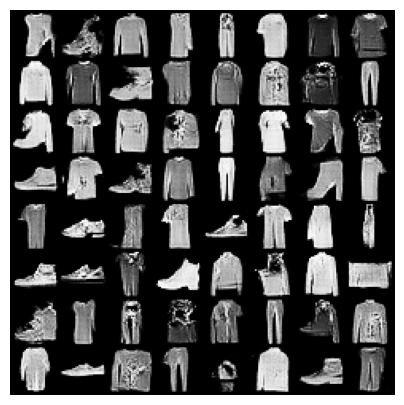

Epoch [1/50] completed. Avg Loss D: 0.2344, Avg Loss G: 0.3087
Time for epoch 1 is 16.075955390930176 sec


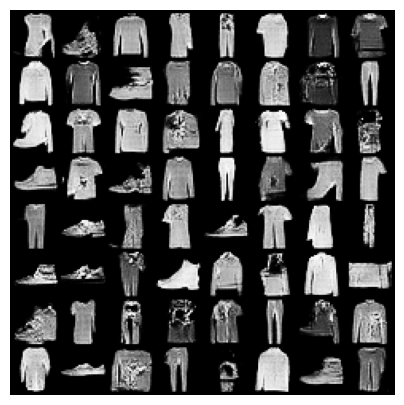

Epoch [2/50] completed. Avg Loss D: 0.2342, Avg Loss G: 0.3077
Time for epoch 2 is 16.228275299072266 sec


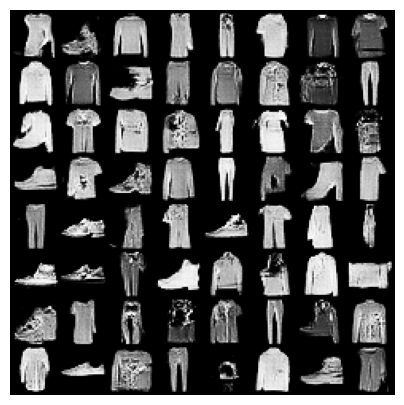

Epoch [3/50] completed. Avg Loss D: 0.2344, Avg Loss G: 0.3075
Time for epoch 3 is 16.09045124053955 sec


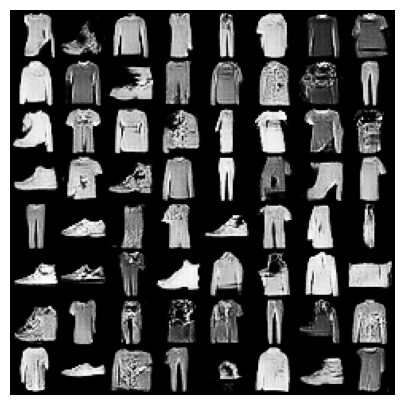

Epoch [4/50] completed. Avg Loss D: 0.2344, Avg Loss G: 0.3058
Time for epoch 4 is 16.061476230621338 sec


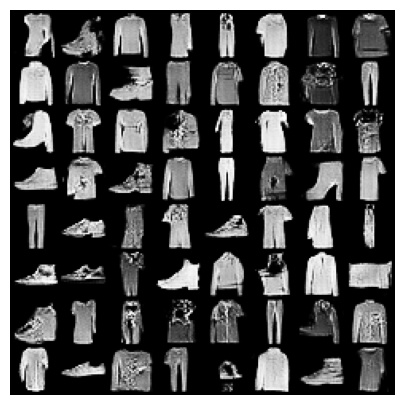

Epoch [5/50] completed. Avg Loss D: 0.2345, Avg Loss G: 0.3120
Time for epoch 5 is 16.37506675720215 sec


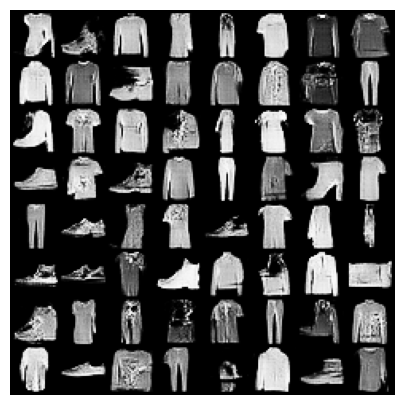

Epoch [6/50] completed. Avg Loss D: 0.2342, Avg Loss G: 0.3041
Time for epoch 6 is 16.05820107460022 sec


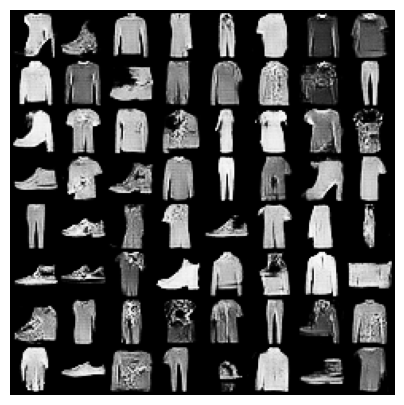

Epoch [7/50] completed. Avg Loss D: 0.2345, Avg Loss G: 0.3076
Time for epoch 7 is 16.481460094451904 sec


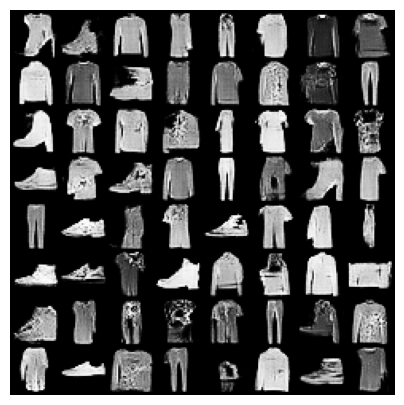

Epoch [8/50] completed. Avg Loss D: 0.2349, Avg Loss G: 0.3082
Time for epoch 8 is 16.3576238155365 sec


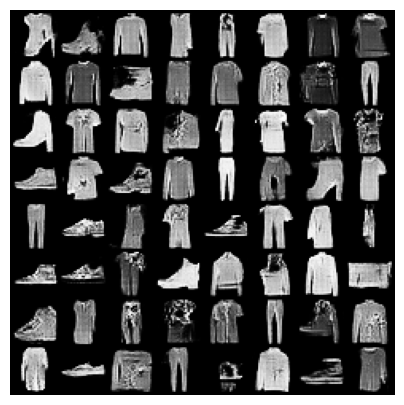

Epoch [9/50] completed. Avg Loss D: 0.2346, Avg Loss G: 0.3072
Time for epoch 9 is 16.250866651535034 sec


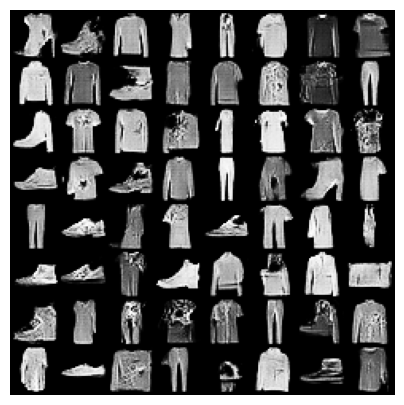

Epoch [10/50] completed. Avg Loss D: 0.2350, Avg Loss G: 0.3075
Time for epoch 10 is 16.2325496673584 sec


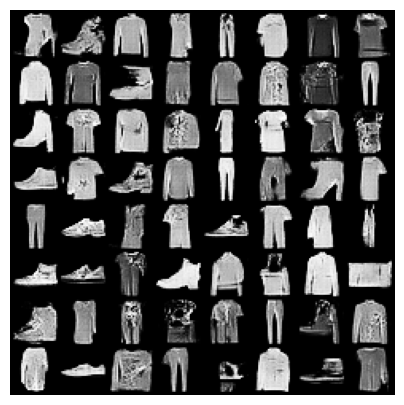

Epoch [11/50] completed. Avg Loss D: 0.2345, Avg Loss G: 0.3065
Time for epoch 11 is 16.38332486152649 sec


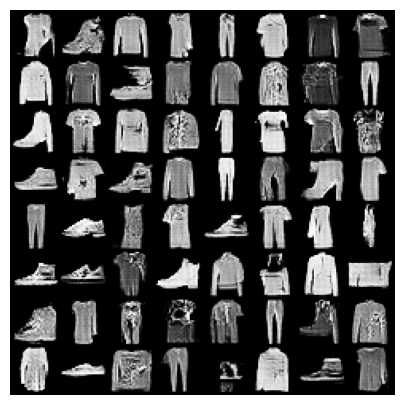

Epoch [12/50] completed. Avg Loss D: 0.2347, Avg Loss G: 0.3075
Time for epoch 12 is 16.49945855140686 sec


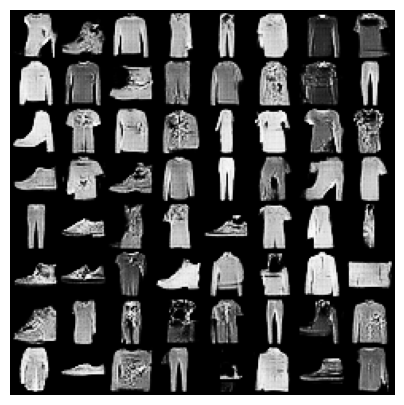

Epoch [13/50] completed. Avg Loss D: 0.2348, Avg Loss G: 0.3065
Time for epoch 13 is 16.54171323776245 sec


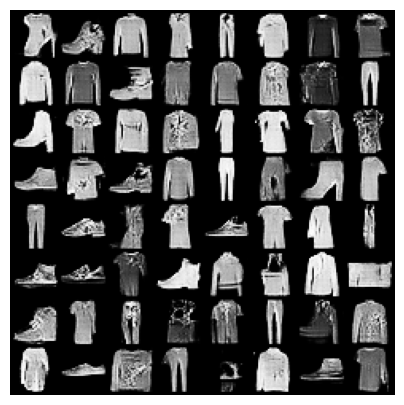

Epoch [14/50] completed. Avg Loss D: 0.2350, Avg Loss G: 0.3059
Time for epoch 14 is 16.344002962112427 sec


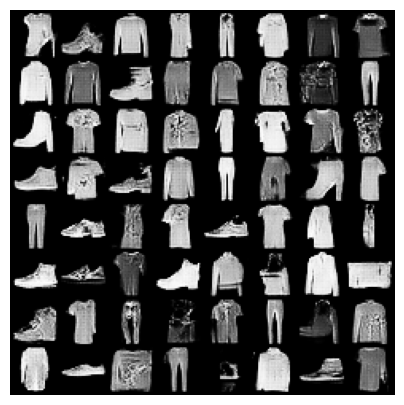

Checkpoint saved at epoch 15
Checkpoint saved at Epoch [15/50].
Epoch [15/50] completed. Avg Loss D: 0.2350, Avg Loss G: 0.3067
Time for epoch 15 is 16.051443338394165 sec


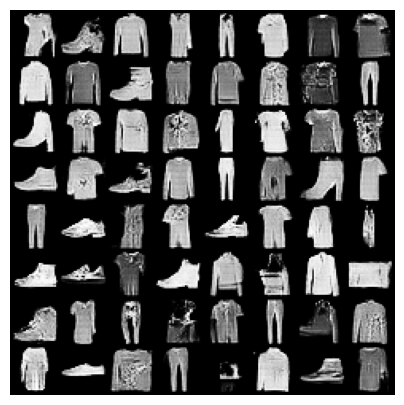

Epoch [16/50] completed. Avg Loss D: 0.2346, Avg Loss G: 0.3063
Time for epoch 16 is 16.383294343948364 sec


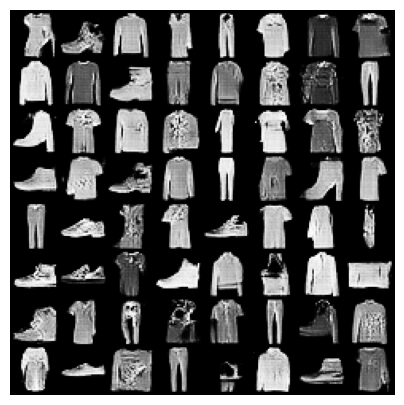

Epoch [17/50] completed. Avg Loss D: 0.2345, Avg Loss G: 0.3068
Time for epoch 17 is 16.16311740875244 sec


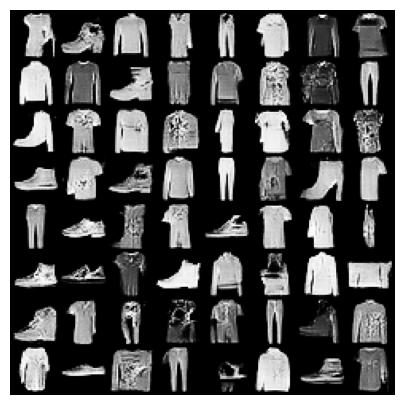

Epoch [18/50] completed. Avg Loss D: 0.2352, Avg Loss G: 0.3063
Time for epoch 18 is 16.101478338241577 sec


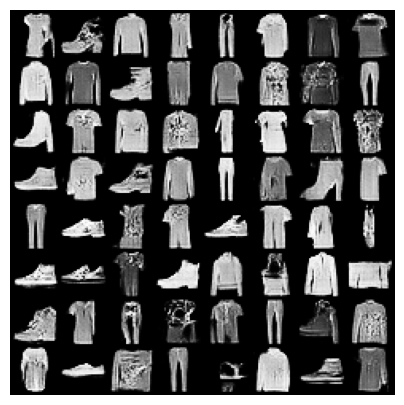

Epoch [19/50] completed. Avg Loss D: 0.2351, Avg Loss G: 0.3068
Time for epoch 19 is 16.13593316078186 sec


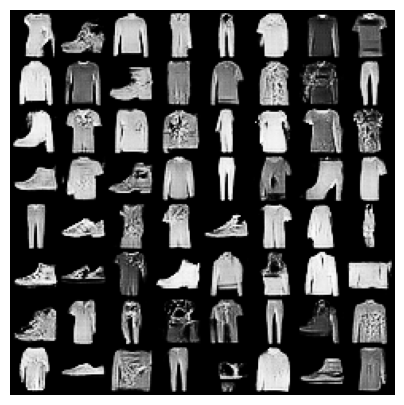

Epoch [20/50] completed. Avg Loss D: 0.2350, Avg Loss G: 0.3061
Time for epoch 20 is 16.028709888458252 sec


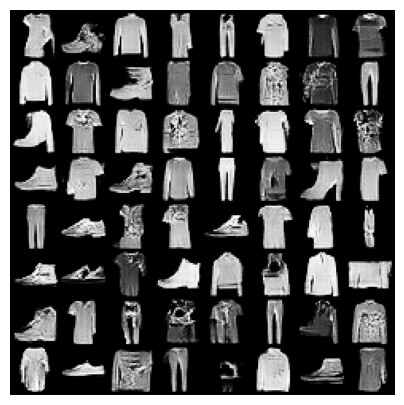

Epoch [21/50] completed. Avg Loss D: 0.2343, Avg Loss G: 0.3058
Time for epoch 21 is 16.034624814987183 sec


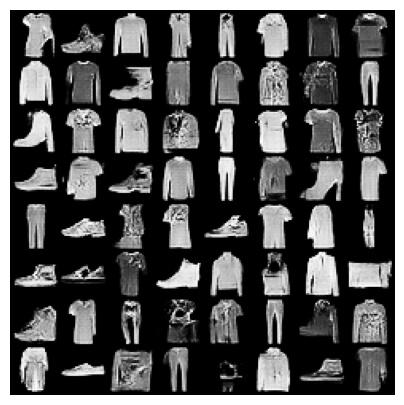

Epoch [22/50] completed. Avg Loss D: 0.2348, Avg Loss G: 0.3061
Time for epoch 22 is 15.927875995635986 sec


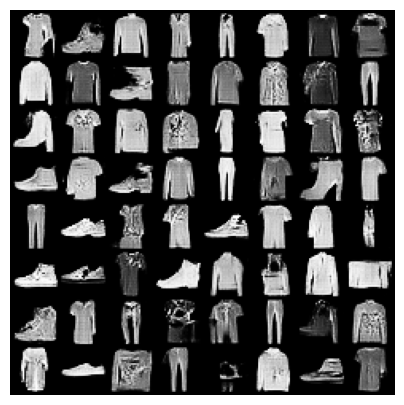

Epoch [23/50] completed. Avg Loss D: 0.2350, Avg Loss G: 0.3077
Time for epoch 23 is 16.301400184631348 sec


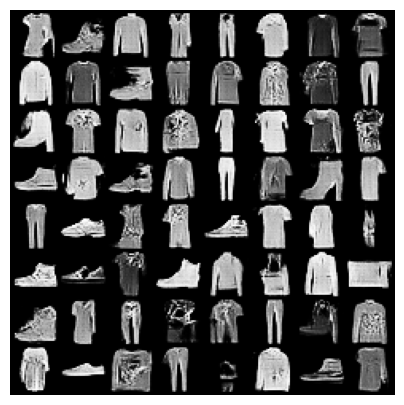

Epoch [24/50] completed. Avg Loss D: 0.2353, Avg Loss G: 0.3046
Time for epoch 24 is 16.43649196624756 sec


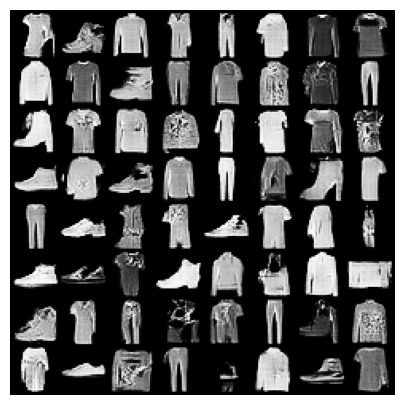

Epoch [25/50] completed. Avg Loss D: 0.2350, Avg Loss G: 0.3067
Time for epoch 25 is 16.567957401275635 sec


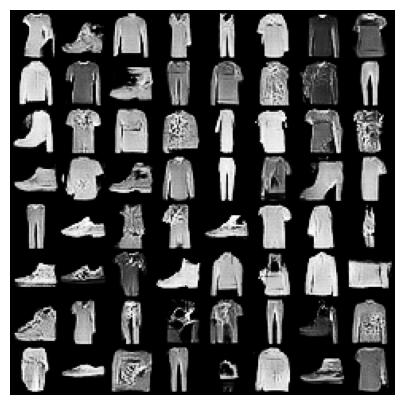

Epoch [26/50] completed. Avg Loss D: 0.2349, Avg Loss G: 0.3065
Time for epoch 26 is 16.9895761013031 sec


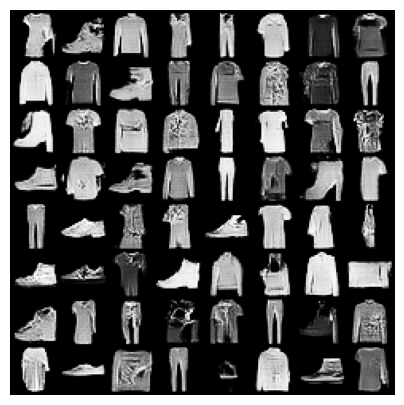

Epoch [27/50] completed. Avg Loss D: 0.2347, Avg Loss G: 0.3060
Time for epoch 27 is 16.881159782409668 sec


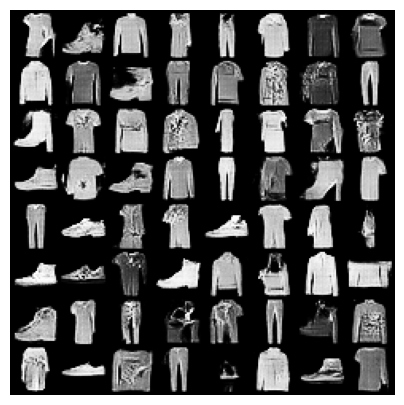

Epoch [28/50] completed. Avg Loss D: 0.2353, Avg Loss G: 0.3050
Time for epoch 28 is 16.617616176605225 sec


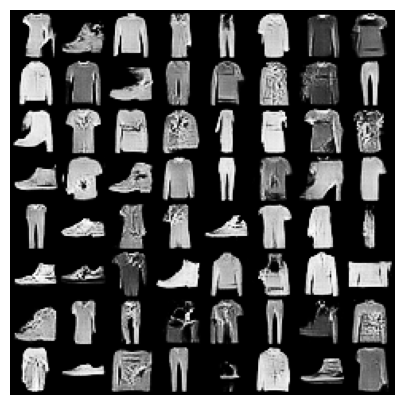

Epoch [29/50] completed. Avg Loss D: 0.2353, Avg Loss G: 0.3129
Time for epoch 29 is 16.435280323028564 sec


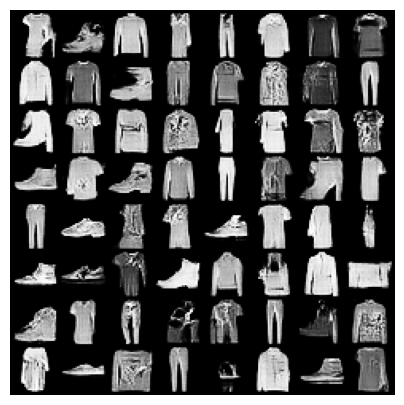

Checkpoint saved at epoch 30
Checkpoint saved at Epoch [30/50].
Epoch [30/50] completed. Avg Loss D: 0.2354, Avg Loss G: 0.3044
Time for epoch 30 is 16.785286903381348 sec


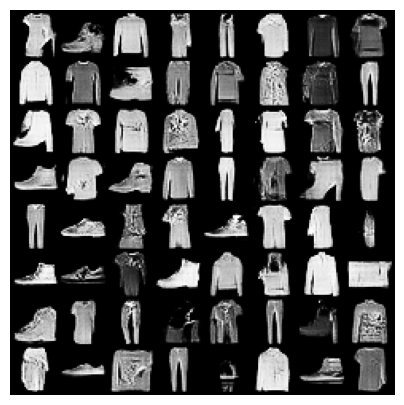

Epoch [31/50] completed. Avg Loss D: 0.2353, Avg Loss G: 0.3041
Time for epoch 31 is 16.592549800872803 sec


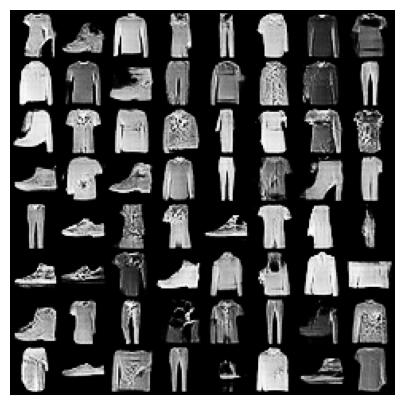

Epoch [32/50] completed. Avg Loss D: 0.2346, Avg Loss G: 0.3113
Time for epoch 32 is 16.62248706817627 sec


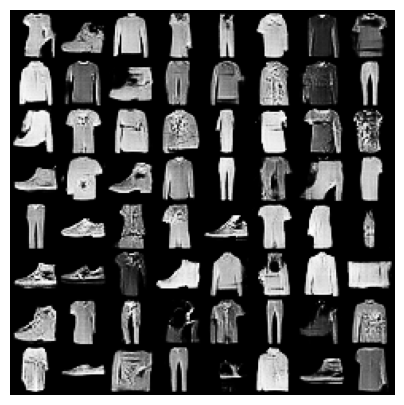

Epoch [33/50] completed. Avg Loss D: 0.2352, Avg Loss G: 0.3065
Time for epoch 33 is 16.436686754226685 sec


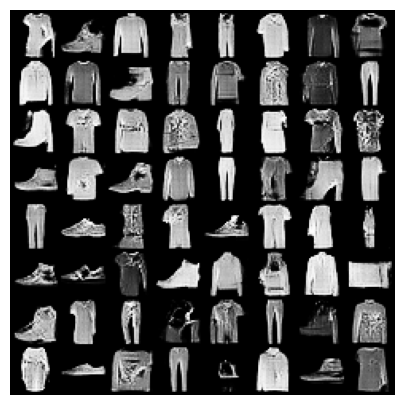

Epoch [34/50] completed. Avg Loss D: 0.2352, Avg Loss G: 0.3040
Time for epoch 34 is 16.535313606262207 sec


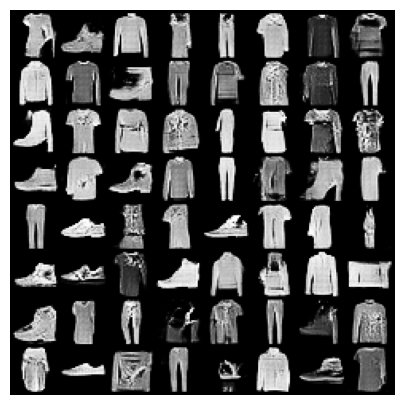

Epoch [35/50] completed. Avg Loss D: 0.2353, Avg Loss G: 0.3057
Time for epoch 35 is 16.52633261680603 sec


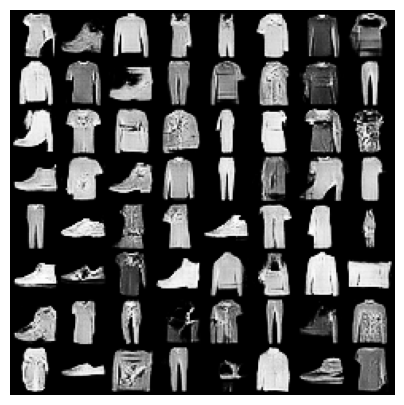

Epoch [36/50] completed. Avg Loss D: 0.2353, Avg Loss G: 0.3051
Time for epoch 36 is 16.345054149627686 sec


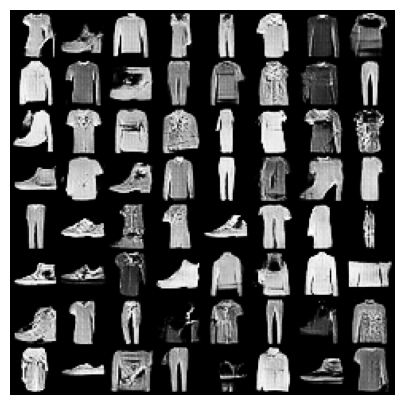

Epoch [37/50] completed. Avg Loss D: 0.2354, Avg Loss G: 0.3052
Time for epoch 37 is 16.53898859024048 sec


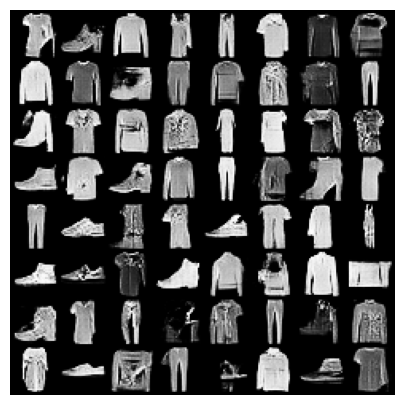

Epoch [38/50] completed. Avg Loss D: 0.2346, Avg Loss G: 0.3061
Time for epoch 38 is 16.34033989906311 sec


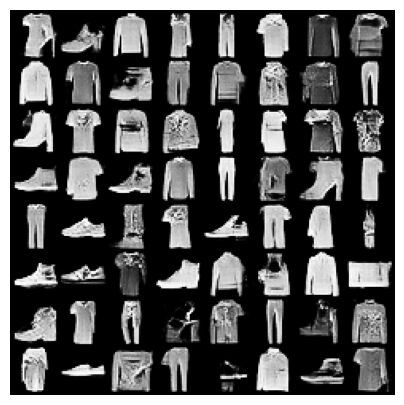

Epoch [39/50] completed. Avg Loss D: 0.2351, Avg Loss G: 0.3066
Time for epoch 39 is 16.581897974014282 sec


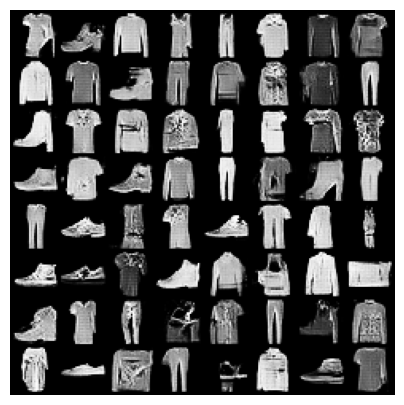

Epoch [40/50] completed. Avg Loss D: 0.2354, Avg Loss G: 0.3059
Time for epoch 40 is 16.313643217086792 sec


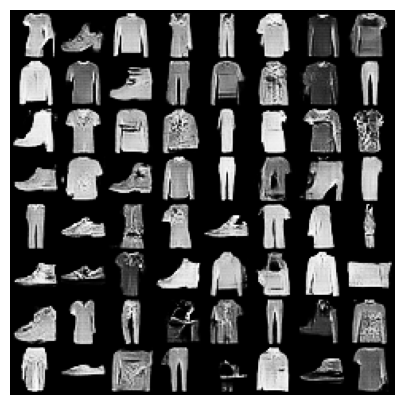

Epoch [41/50] completed. Avg Loss D: 0.2353, Avg Loss G: 0.3057
Time for epoch 41 is 16.439934015274048 sec


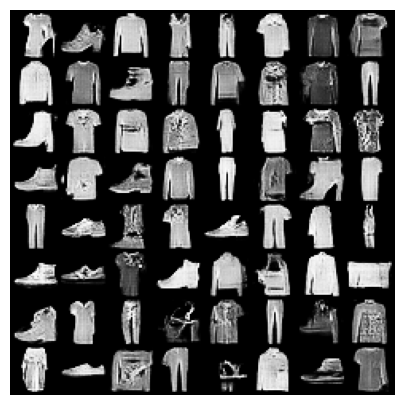

Epoch [42/50] completed. Avg Loss D: 0.2349, Avg Loss G: 0.3057
Time for epoch 42 is 16.414921045303345 sec


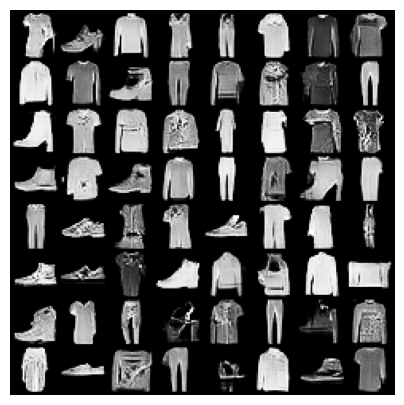

Epoch [43/50] completed. Avg Loss D: 0.2342, Avg Loss G: 0.3053
Time for epoch 43 is 16.283979177474976 sec


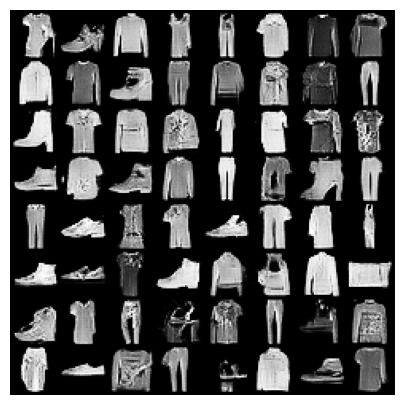

Epoch [44/50] completed. Avg Loss D: 0.2359, Avg Loss G: 0.3048
Time for epoch 44 is 16.690478801727295 sec


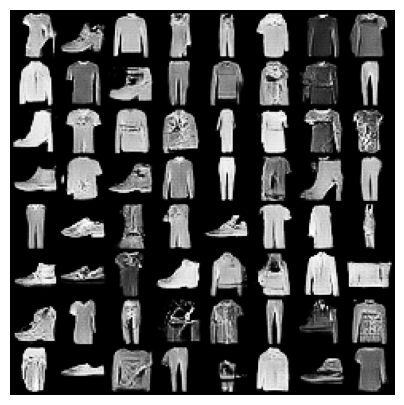

Checkpoint saved at epoch 45
Checkpoint saved at Epoch [45/50].
Epoch [45/50] completed. Avg Loss D: 0.2348, Avg Loss G: 0.3029
Time for epoch 45 is 16.617840051651 sec


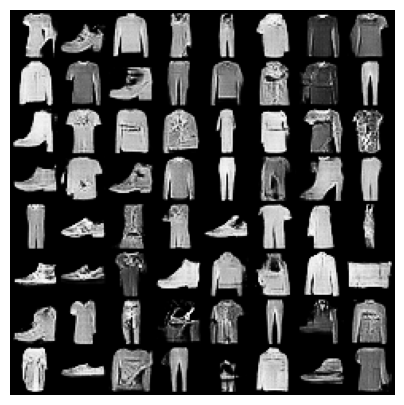

Epoch [46/50] completed. Avg Loss D: 0.2354, Avg Loss G: 0.3058
Time for epoch 46 is 16.412492036819458 sec


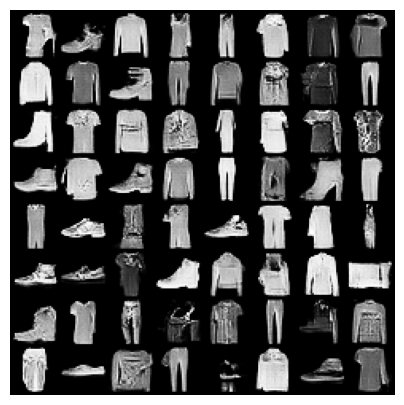

Epoch [47/50] completed. Avg Loss D: 0.2355, Avg Loss G: 0.3059
Time for epoch 47 is 16.491466760635376 sec


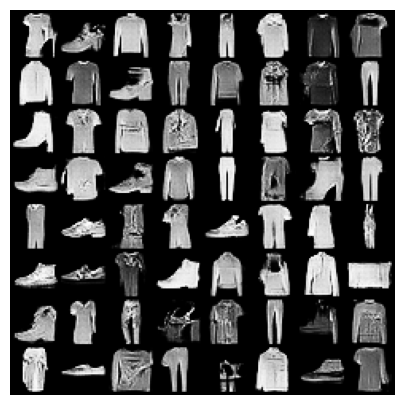

Epoch [48/50] completed. Avg Loss D: 0.2352, Avg Loss G: 0.3054
Time for epoch 48 is 16.426279306411743 sec


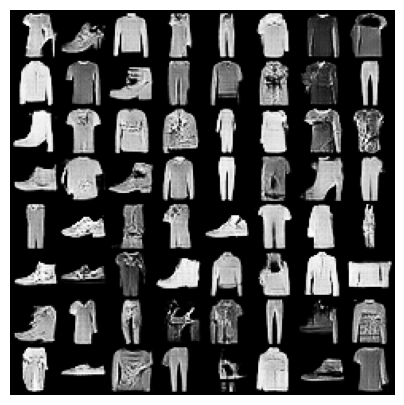

Epoch [49/50] completed. Avg Loss D: 0.2344, Avg Loss G: 0.3054
Time for epoch 49 is 16.56943655014038 sec


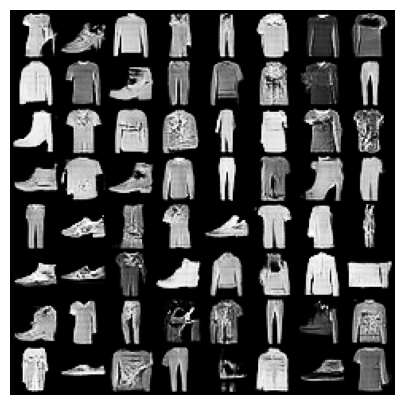

Epoch [50/50] completed. Avg Loss D: 0.2357, Avg Loss G: 0.3052
Time for epoch 50 is 16.4154953956604 sec


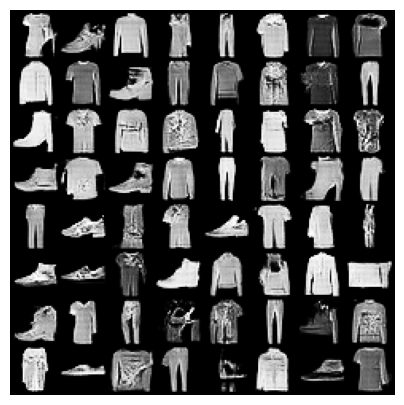

In [51]:
train(trn_data, EPOCHS, genG, fixed_seed, checkpoint_prefix, discriminator, optimizerG, optimizerD, criterion, device)

##### Both the models were trained for 50 Epochs and gave very good results. Overall, re-training the LSGAN gave better results when compared to the initial training.

###### The primary difference between LSGANs and traditional GANs lies in their loss functions. Traditional GANs use a binary cross-entropy loss that forces the discriminator to classify inputs as either real or fake. LSGANs employ a least squares loss function for the discriminator, which penalizes deviations from the real and fake labels more smoothly. Thus the results in LSGAN as seen above tend to be higher quality generations and more stable training dynamics, as it effectively reduces the gradient vanishing problem and encourages the generator to produce results closer to the real data distribution.